In [1]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

from datetime import datetime
from enum import Enum
from itertools import combinations, product

from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import make_column_transformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, ClassifierMixin, TransformerMixin
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, make_scorer

import os

FIGURE_SIZE = (15, 12)
SNS_FIGURE_SIZE = (20, 15)
RANDOM_STATE = 42
TEST_SIZE = 0.2

import warnings
warnings.filterwarnings("ignore")

In [2]:
#Reading Dataset
data_train = pd.read_csv('6439027_2_training.csv')
data_test = pd.read_csv('6439027_3_testing.csv')

In [8]:
data_train_w = data_train.copy()

In [3]:
#Chechking Shape of Dataset
data_train.shape , data_test.shape

((14803, 32), (4932, 32))

In [4]:
#checking top 5 rows
data_train.head(5)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,NSM,WeekStatus,Day_of_week
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,61200,Weekday,Monday
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,61800,Weekday,Monday
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,62400,Weekday,Monday
3,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,63600,Weekday,Monday
4,2016-01-11 17:50:00,50,40,19.89,46.026667,19.2,44.500000,19.79,44.933333,18.890000,...,734.0,92.0,5.333333,43.833333,4.8,44.919484,44.919484,64200,Weekday,Monday


### Exploratory Data Analysis

In [6]:
# plotly
#import plotly.plotly as py
from chart_studio import plotly
from plotly.offline import init_notebook_mode, iplot
#init_notebook_mode(connected=True)
import plotly.graph_objs as go

# To understand the timeseries variation of the applaince energy consumption
visData = go.Scatter( x= data_train.date  ,  mode = "lines", y = data_train.Appliances )
layout = go.Layout(title = 'Appliance energy consumption measurement' , xaxis=dict(title='Date'), yaxis=dict(title='(Wh)'))
fig = go.Figure(data=[visData],layout=layout)

iplot(fig)

In [10]:
data_train_w = data_train.iloc[:,0:2]
data_train_w = data_train.set_index('date')
data_train_w.tail()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,NSM,WeekStatus,Day_of_week
date,,,,,,,,,,,,,,,,,,,,,
2016-05-27 17:00:00,110,0,25.600000,47.193333,25.968571,42.528571,27.390000,41.030000,24.7,45.626667,...,755.2,55.000000,3.000000,22.000000,13.400000,18.248201,18.248201,61200,Weekday,Friday
2016-05-27 17:10:00,90,0,25.533333,46.860000,25.978000,42.534000,27.323333,41.090000,24.7,45.626667,...,755.2,55.333333,3.166667,22.833333,13.366667,16.966162,16.966162,61800,Weekday,Friday
2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.7,45.590000,...,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940,63000,Weekday,Friday
2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.7,45.790000,...,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784,64200,Weekday,Friday
2016-05-27 18:00:00,430,10,25.500000,46.600000,25.264286,42.971429,26.823333,41.156667,24.7,45.963333,...,755.2,57.000000,4.000000,27.000000,13.200000,34.118851,34.118851,64800,Weekday,Friday


Text(0, 0.5, 'Energy usage in Wh')

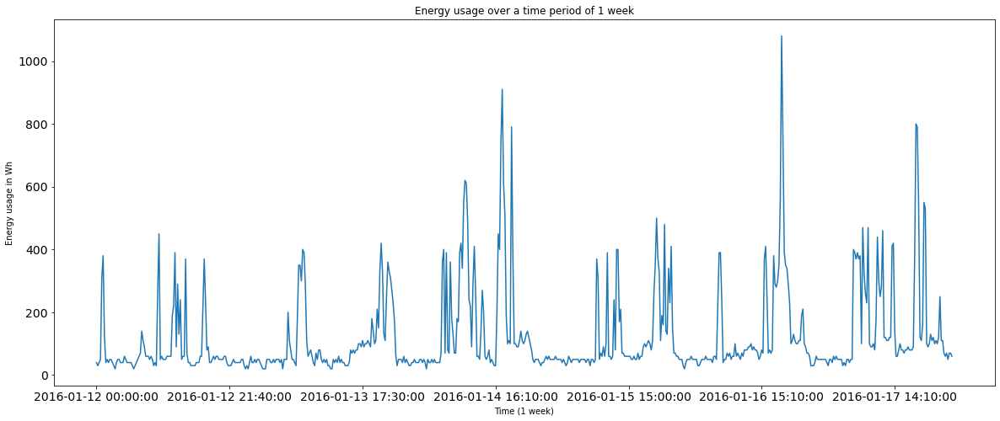

In [12]:
#converting Date column to Datetype 
#data_train['date'] = pd.to_datetime(data_train['date'])
# Visualizing energy usage for a week to get a clear view of data distribution
data_train_w.Appliances['2016-01-12':'2016-01-18'].plot(figsize=(20,8), title= 'Energy usage over a time period of 1 week',fontsize=14)
plt.xlabel('Time (1 week)')
plt.ylabel('Energy usage in Wh')

<AxesSubplot:xlabel='Appliances', ylabel='Count'>

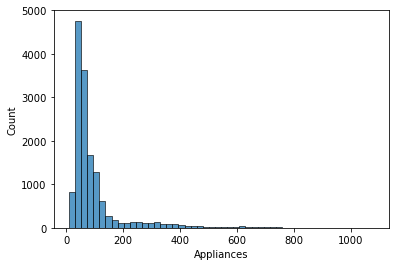

In [13]:
sns.histplot(data_train['Appliances'],bins=50)


 The histogram shows the frequency of energy consumption in the interval (bar width),

<AxesSubplot:xlabel='Appliances'>

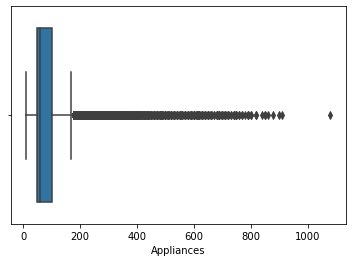

In [14]:
import seaborn as sns
sns.boxplot(data_train['Appliances'])

The boxplot shows the location of the median with the black line.

Pairs plot showing relationships between the energy consumption of appliances with: T3, RH3, T2, RH2, T1, RH1, lights.

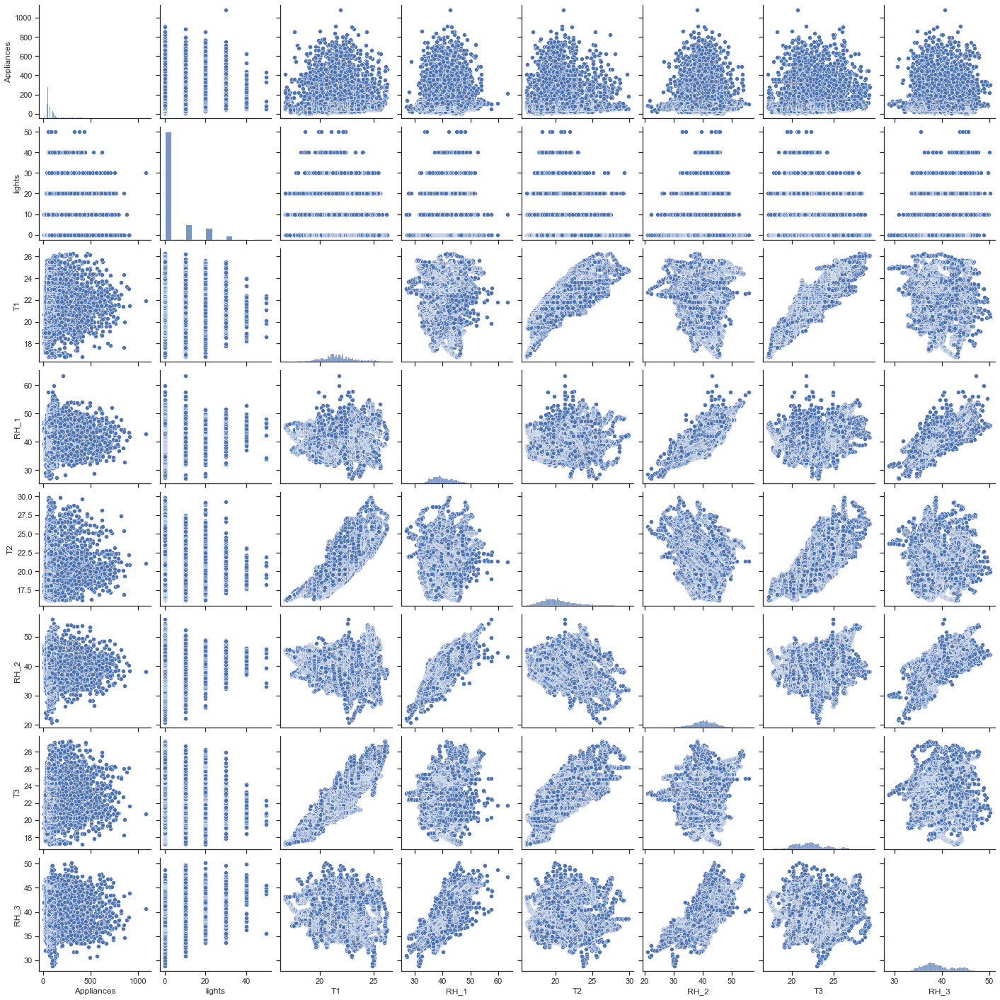

In [27]:
#col = ['t6','t2', 'rh_2','lights','hour','t_out','windspeed','tdewpoint']
col = ['Appliances','lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3']
sns.set(style="ticks", color_codes=True)
g = sns.pairplot(data_train[col])
plt.show();

Correlation between the energy consumption of appliances with: T3, RH3, T2, RH2, T1, RH1, lights.

<AxesSubplot:>

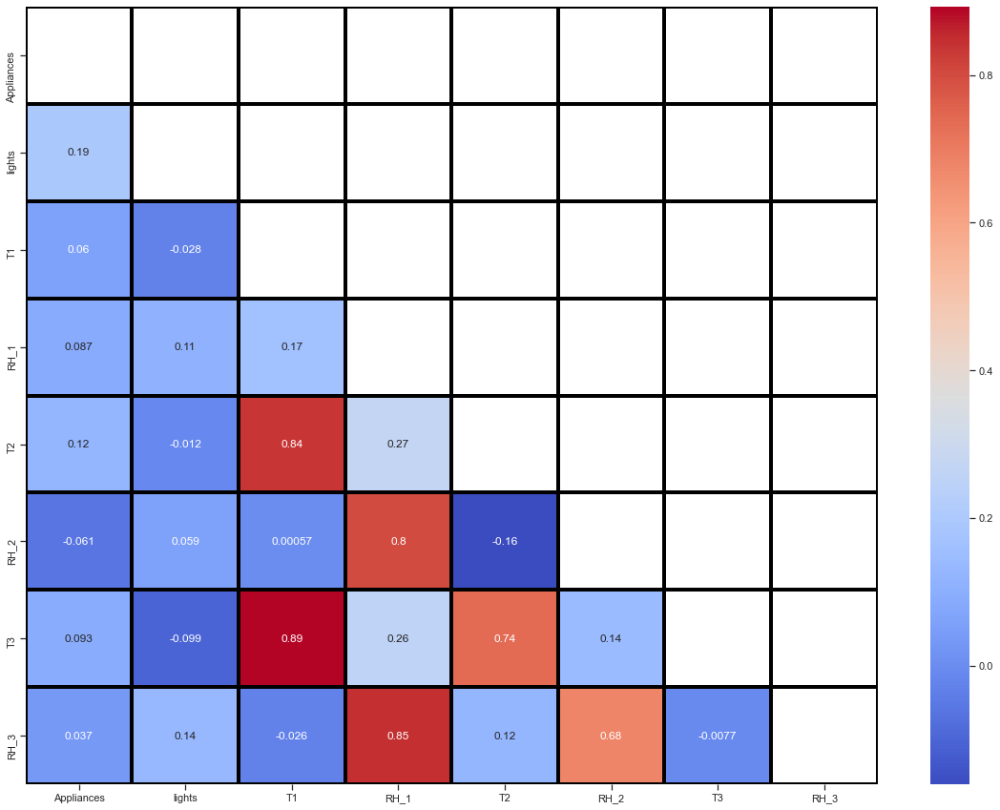

In [28]:
#Chechking for correlations  between feature
fig, ax = plt.subplots(figsize=SNS_FIGURE_SIZE)
mask_matrix = np.triu(data_train[col].corr())
sns.heatmap(data_train[col].corr(), annot = True, cmap= 'coolwarm', linewidths=3, linecolor='black', mask=mask_matrix)

Pairs plot showing relationships between the energy consumption of appliances with: T4, RH4, T5, RH5, T6, RH6. T4 and RH4
correspond to the office conditions; T5 and RH5 correspond to the
bathroom conditions, and T6 and RH6 correspond to the outdoor
conditions.

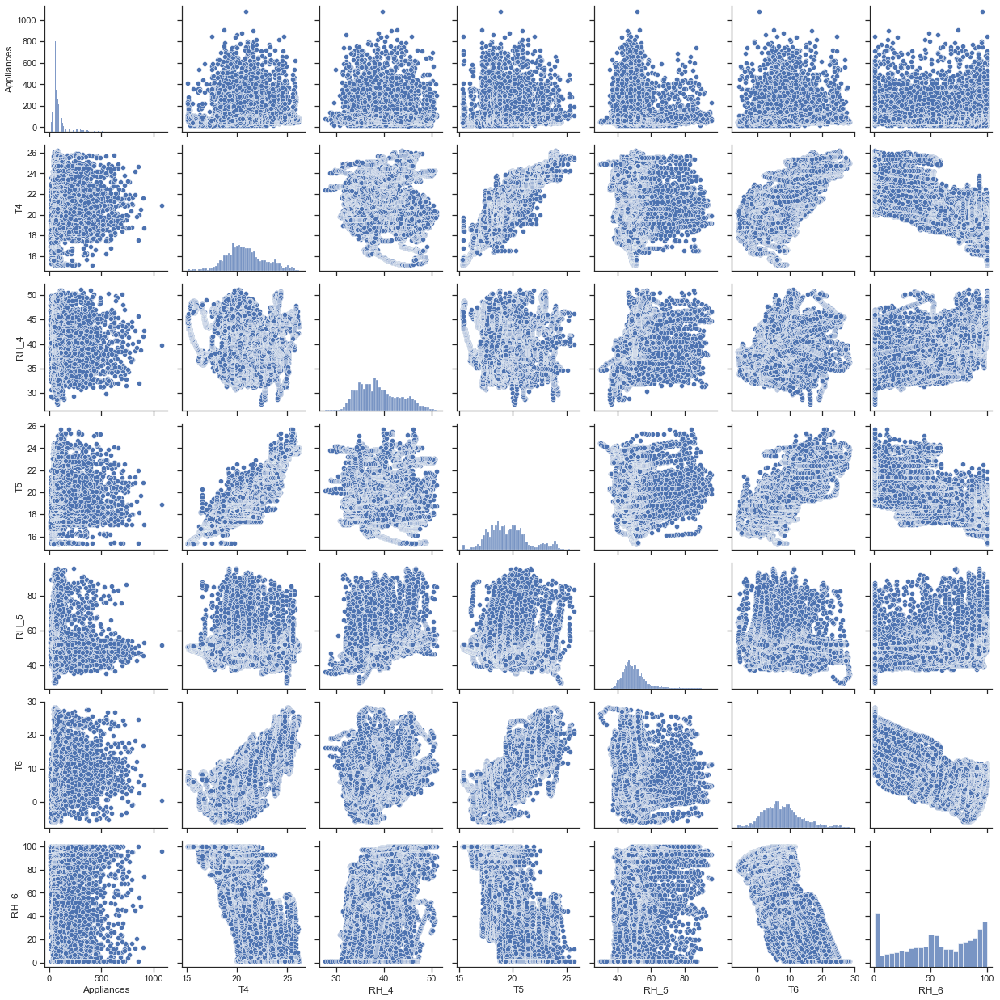

In [32]:

#col = ['t6','t2', 'rh_2','lights','hour','t_out','windspeed','tdewpoint']
col = ['Appliances','T4','RH_4', 'T5', 'RH_5', 'T6', 'RH_6']
sns.set(style="ticks", color_codes=True)
g = sns.pairplot(data_train[col])
plt.show();

Correlation between the energy consumption of appliances with: T4, RH4, T5, RH5, T6, RH6. T4 and RH4
correspond to the office conditions; T5 and RH5 correspond to the
bathroom conditions, and T6 and RH6 correspond to the outdoor
conditions.

<AxesSubplot:>

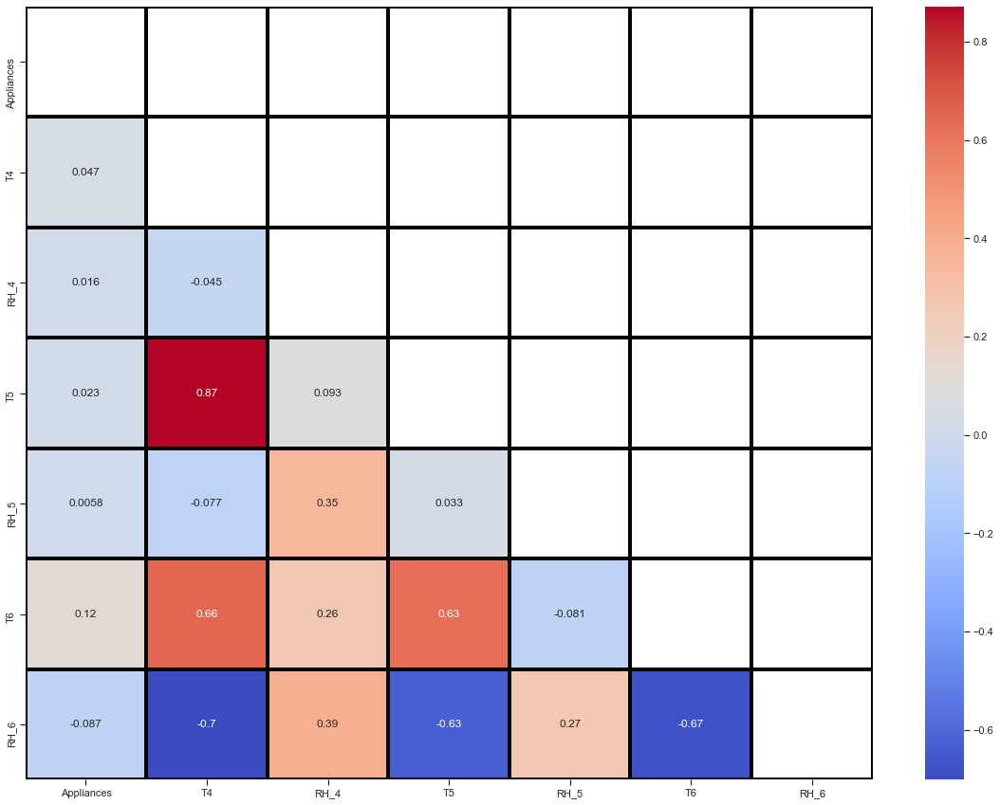

In [33]:
#Chechking for correlations  between feature
fig, ax = plt.subplots(figsize=SNS_FIGURE_SIZE)
mask_matrix = np.triu(data_train[col].corr())
sns.heatmap(data_train[col].corr(), annot = True, cmap= 'coolwarm', linewidths=3, linecolor='black', mask=mask_matrix)

Pairs plot showing relationships between the consumption of appliances with: T out, Pressure, RH out, Windspeed,
Visibility, TDewpoint, NSM and T6. 

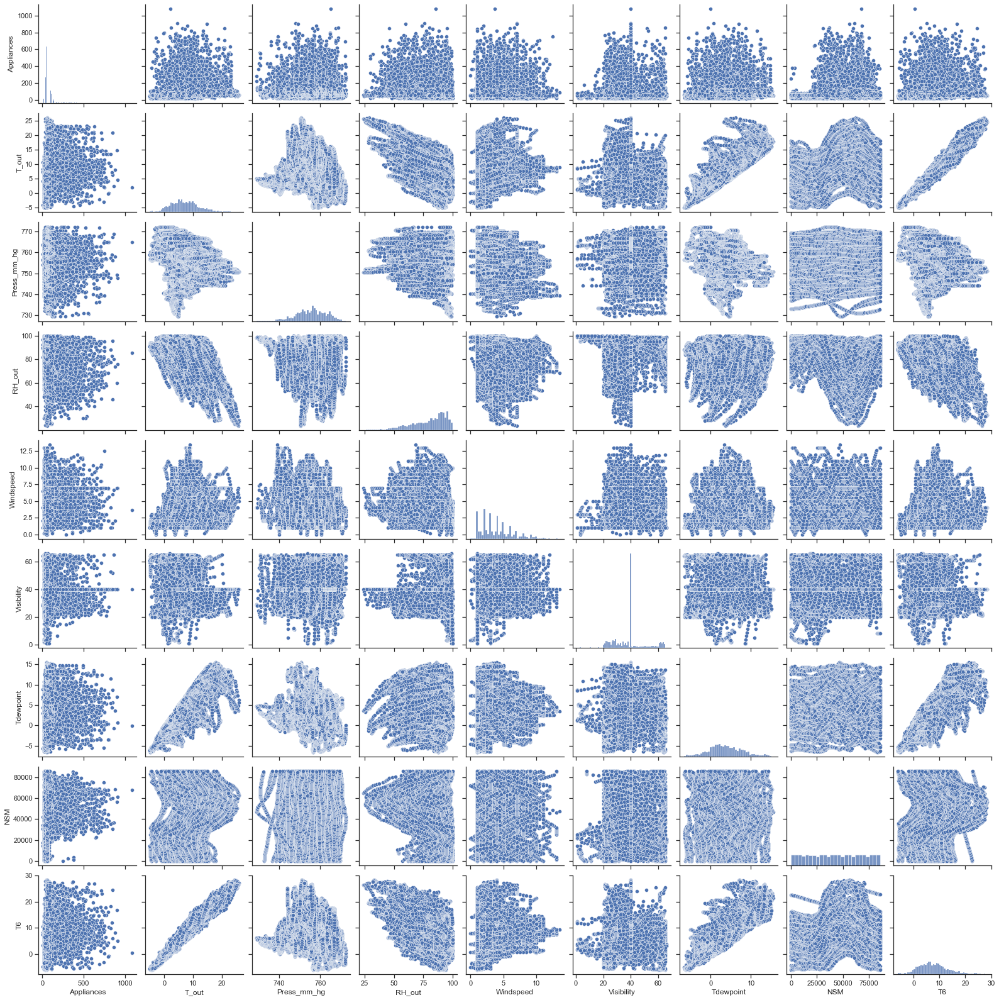

In [36]:


#col = ['t6','t2', 'rh_2','lights','hour','t_out','windspeed','tdewpoint']
col = ['Appliances','T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'NSM', 'T6']
sns.set(style="ticks", color_codes=True)
g = sns.pairplot(data_train[col])
plt.show();

Correlation between the energy consumption of appliances with: T out, Pressure, RH out, Windspeed,
Visibility, TDewpoint, NSM and T6.

<AxesSubplot:>

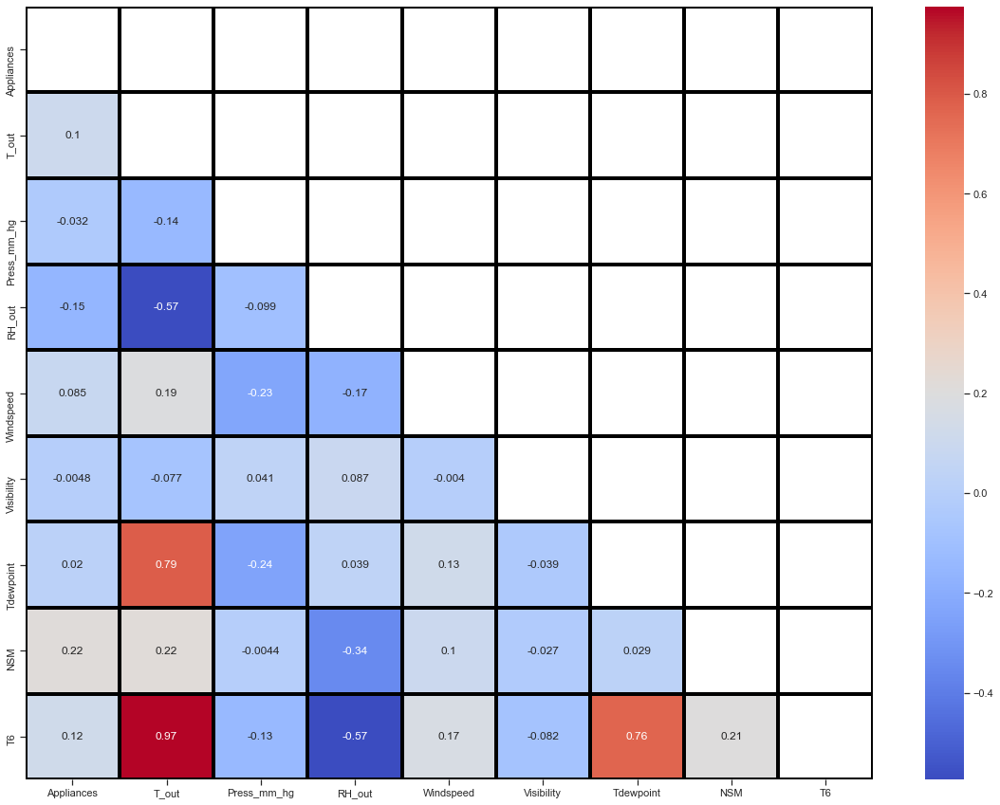

In [37]:
#Chechking for correlations  between feature
fig, ax = plt.subplots(figsize=SNS_FIGURE_SIZE)
mask_matrix = np.triu(data_train[col].corr())
sns.heatmap(data_train[col].corr(), annot = True, cmap= 'coolwarm', linewidths=3, linecolor='black', mask=mask_matrix)

### Data Preparation

In [ ]:
#Preparing Independent and Dependent Features
features_df = data_train.drop(['rv1', 'rv2','lights', 'Appliances'], axis = 1)
target_column = data_train['Appliances'] + data_train['lights'] 

In [ ]:
#Chechking any Null values
features_df.isnull().sum()

In [ ]:
#Chechking for correlations  between feature
fig, ax = plt.subplots(figsize=SNS_FIGURE_SIZE)
mask_matrix = np.triu(features_df.corr())
sns.heatmap(features_df.corr(), annot = True, cmap= 'coolwarm', linewidths=3, linecolor='black', mask=mask_matrix)

If we set the "correlation limit" to 0.8, we get 4 potential groups of variables with high correlation and therefore redundent

In [ ]:
#Creating Groups on the basis of correlation
correlated_column_group_1 = ['T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T8', 'T9']
correlated_column_group_2 = ['RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_7']
correlated_column_group_3 = ['T6', 'T_out'] # Tdewpoint could be added (correlation of 0.79)
correlated_column_group_4 = ['RH_8', 'RH_9']

In [ ]:
#converting Date column to Datetype 
features_df['date'] = pd.to_datetime(features_df['date'])

In [ ]:
#Checking Inofrmation of Dataset
features_df.info()

In [ ]:
#One-Hot Encoding for categorical Columns
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()


In [ ]:
features_df['WeekStatus'] = lb.fit_transform(features_df['WeekStatus'])
features_df['Day_of_week'] = lb.fit_transform(features_df['Day_of_week'])

In [ ]:
features_df.info()

Time feature extraction

In [ ]:
irrelevant_features = []
irrelevant_features.append('date')

In [ ]:
#Splitting Datetime object columnn
def time_features_extractor (df, attr_list = ('year', 'month', 'day', 'hour', 'minute', 'second', 'dayofweek')):
    for attr in attr_list:
        df[attr] = df['date'].apply(lambda x: getattr(x, attr))
    return df

In [ ]:
features_df = time_features_extractor(features_df, ('dayofweek', 'month', 'hour'))
features_df.sample(5)

In [ ]:
features_df['weekday'] = features_df['dayofweek'].apply(lambda x: x//5)
irrelevant_features.append('dayofweek')

In [ ]:
#creating two group by objects, one for month and one for day
gb_month = features_df.groupby(['month'])
gb_hour = features_df.groupby(['hour'])

correlated column group 1

In [ ]:
ccgroup1_gb_month = gb_month[correlated_column_group_1]
ccgroup1_gb_hour = gb_hour[correlated_column_group_1]

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=FIGURE_SIZE)
ccgroup1_gb_month.mean().plot(ax=ax1)
ccgroup1_gb_hour.mean().plot(ax=ax2)

ax1.set_ylabel('Temprature[C]')
ax2.set_ylabel('Temprature[C]')

From this view, we can see the besides T2, most of those features shows a very similar trend and a small variety of values (around 1 degree), but T2 shows a different trend from the rest, and offers a wider variety of values(up to 3 degrees)

In [ ]:
#we'll first create a function to average the correlated features and 
#then we'll add the irrelevant results to our irrelevant features list

def features_average (df, features_to_average, new_feature_name):
    df[new_feature_name] = np.mean(df[features_to_average], axis=1)
    return df

In [ ]:
correlated_column_group_1.remove('T2')
irrelevant_features = irrelevant_features + correlated_column_group_1
features_df = features_average(features_df,
                               features_to_average = correlated_column_group_1,
                               new_feature_name = 'T_avg_1_3_4_5_7_8_9')
features_df.sample(5)

correlated column group 2

In [ ]:
ccgroup2_gb_month = gb_month[correlated_column_group_2]
ccgroup2_gb_hour = gb_hour[correlated_column_group_2]

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=FIGURE_SIZE)
ccgroup2_gb_month.mean().plot(ax=ax1)
ccgroup2_gb_hour.mean().plot(ax=ax2)

ax1.set_ylabel('Humidity[%]')
ax2.set_ylabel('Humidity[%]')

Again, we can see that we have a group of features that acts similarly and one act as a "outlier" ('RH_7')

In [ ]:
correlated_column_group_2.remove('RH_7')
irrelevant_features = irrelevant_features + correlated_column_group_2
features_df = features_average(features_df,
                               features_to_average = correlated_column_group_2,
                               new_feature_name = 'RH_avg_1_2_3_4')
features_df.sample(5)

correlated group 3

In [ ]:
ccgroup3_gb_month = gb_month[correlated_column_group_3]
ccgroup3_gb_hour = gb_hour[correlated_column_group_3]

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=FIGURE_SIZE)
ccgroup3_gb_month.mean().plot(ax=ax1)
ccgroup3_gb_hour.mean().plot(ax=ax2)

ax1.set_ylabel('Temprature[C]')
ax2.set_ylabel('Temprature[C]')

These two features are almost identical - so we'll unite them

In [ ]:
irrelevant_features = irrelevant_features + correlated_column_group_3
features_df = features_average(features_df,
                               features_to_average = correlated_column_group_3,
                               new_feature_name = 'T_avg_6_out')
features_df.sample(5)

cprrelated group 4

In [ ]:
ccgroup4_gb_month = gb_month[correlated_column_group_4]
ccgroup4_gb_hour = gb_hour[correlated_column_group_4]

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=FIGURE_SIZE)
ccgroup4_gb_month.mean().plot(ax=ax1)
ccgroup4_gb_hour.mean().plot(ax=ax2)

ax1.set_ylabel('Humidity[%]')
ax2.set_ylabel('Humidity[%]')

These two features are almost identical - so we'll unite them

In [ ]:
irrelevant_features = irrelevant_features + correlated_column_group_4
features_df = features_average(features_df,
                               features_to_average = correlated_column_group_4,
                               new_feature_name = 'RH_avg_8_9')
features_df.sample(5)

In [ ]:
#Now that we've found our irrelevant features, we'll exclude them from df and check again how many features we have now
irrelevant_features.append('hour')

chosen_features_df = features_df.drop(irrelevant_features, axis=1)
chosen_features_df.shape

In [ ]:
#Now again checking correlation
fig, ax = plt.subplots(figsize=SNS_FIGURE_SIZE)
mask_matrix = np.triu(chosen_features_df.corr())
sns.heatmap(chosen_features_df.corr(), annot = True, cmap= 'coolwarm', linewidths=3, linecolor='black', mask=mask_matrix)

In [ ]:
#Before we'll fit our selected features to the model, we'll preprocess(mostly normalization) our data.
temperature_columns = [column_name for column_name in chosen_features_df.columns if column_name.startswith('T')]
humidity_columns = [column_name for column_name in chosen_features_df.columns if column_name.startswith('RH')]
environment_columns = ['Windspeed', 'Press_mm_hg', 'Visibility']

For the temprature and humidity columns, we'll use a global min/max scaler. meaning that we'll take the global min/max from all temperature/humidity columns, and use those limits for our scaling the data between 0 to 1

To that purpose we'll bulit a custom transformer.

In [ ]:
class CustomMinMaxScaler (BaseEstimator, TransformerMixin):
    def __init__(self, columns_to_scale):
        self.columns_to_scale = columns_to_scale

    def fit(self, X, y=None):
        self.min_value_ = self._get_global_min(X[self.columns_to_scale])
        self.max_value_ = self._get_global_max(X[self.columns_to_scale])
        return self

    def transform(self, X, *_):
        norm_value = self.max_value_ - self.min_value_ 
        X[self.columns_to_scale] = X[self.columns_to_scale].apply(lambda x: (x-self.min_value_)/norm_value)
        return X

    def _get_global_max(self, part_X):
        return max(np.max(part_X))

    def _get_global_min(self, part_X):
        return min(np.min(part_X))

In [ ]:
scaled_features_df = chosen_features_df.copy()

temperature_scaler = CustomMinMaxScaler(columns_to_scale = temperature_columns)
temperature_scaler.fit_transform(scaled_features_df)

humidity_scaler = CustomMinMaxScaler(columns_to_scale = humidity_columns)
humidity_scaler.fit_transform(scaled_features_df)

Great! for the rest of the columns, we'll scale them in the same range of our other columns, so we'll use the standard MinMaxScaler

In [ ]:
min_max_scaler = MinMaxScaler()
scaled_features_df['Press_mm_hg'] = min_max_scaler.fit_transform(np.array(chosen_features_df['Press_mm_hg']).reshape(-1,1))
scaled_features_df['Windspeed'] = min_max_scaler.fit_transform(np.array(chosen_features_df['Windspeed']).reshape(-1,1))
scaled_features_df['Visibility'] = min_max_scaler.fit_transform(np.array(chosen_features_df['Visibility']).reshape(-1,1))

Good, so now we have our features chosen and scaled, we'll set the final groups and create a column transformer to orginize the results neatly.

In [ ]:
class ColumnsDevision(Enum):
    final_temperature_columns = [column_name for column_name in scaled_features_df.columns if column_name.startswith('T')]
    final_humidity_columns = [column_name for column_name in scaled_features_df.columns if column_name.startswith('RH')]
    final_environment_columns = ['Press_mm_hg', 'Windspeed', 'Visibility']

column_transformer = make_column_transformer(
                        (CustomMinMaxScaler(columns_to_scale = ColumnsDevision.final_temperature_columns.value), ColumnsDevision.final_temperature_columns.value),
                        (CustomMinMaxScaler(columns_to_scale = ColumnsDevision.final_temperature_columns.value), ColumnsDevision.final_humidity_columns.value),
                        (MinMaxScaler(), ColumnsDevision.final_environment_columns.value),
                        )

In [ ]:
regression_df = scaled_features_df.copy()
X_train, X_test, y_train, y_test = train_test_split(regression_df, target_column, test_size=TEST_SIZE, random_state=RANDOM_STATE) # stratify=y

In [ ]:
from sklearn.svm import SVR
models = [
           ['Linear regression: ', LinearRegression()],
           ['Random Forest Regressor: ', RandomForestRegressor()],
           [' SVM: ',  SVR()],
         ]

rmse_loss = lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred))
model_data = []
for name,curr_model in models :
    curr_model_data = {}
    curr_model_data["Name"] = name
    curr_model.fit(X_train, y_train)
    curr_model_data["Train_RMSE_Score"] = round(rmse_loss(y_train, curr_model.predict(X_train)),2)
    curr_model_data["Train_R^2_Score"] = round(r2_score(y_train, curr_model.predict(X_train)),2)
    curr_model_data["Test_RMSE_Score"] = round(rmse_loss(y_test,curr_model.predict(X_test)),2)
    curr_model_data["Test_R^2_Score"] = round(r2_score(y_test,curr_model.predict(X_test)),2)
    model_data.append(curr_model_data)

model_data

Above is the result we have produced without using RFE feature selection techniques

# RFE

Recursive Feature Elimination ( RFE )    
Now onto the next method in our feature ranking endeavour. Recursive Feature Elimination or RFE uses a model ( eg. linear Regression or SVM) to select either the best or worst-performing feature, and then excludes this feature. The whole process is then iterated until all features in the dataset are used up ( or up to a user-defined limit). Sklearn conveniently possesses a RFE function via the sklearn.feature_selection call and we will use this along with a simple linear regression model for our ranking search as follows:

In [ ]:
from sklearn.feature_selection import RFE, f_regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso

In [ ]:
# Store the column/feature names into a list "colnames"
colnames = regression_df.columns

In [ ]:
# Define dictionary to store our rankings
ranks = {}
# Create our function which stores the feature rankings to the ranks dictionary
def ranking(ranks, names, order=1):
    minmax = MinMaxScaler()
    ranks = minmax.fit_transform(order*np.array([ranks]).T).T[0]
    ranks = map(lambda x: round(x,2), ranks)
    return dict(zip(names, ranks))

In [ ]:
# Construct our Linear Regression model
lr = LinearRegression(normalize=True)
lr.fit(X_train,y_train)
#stop the search when only the last feature is left
rfe = RFE(lr, n_features_to_select=1, verbose =3 )
rfe.fit(X_train,y_train)
ranks["RFE"] = ranking(list(map(float, rfe.ranking_)), colnames, order=-1)

In [ ]:
# Using Linear Regression
lr = LinearRegression(normalize=True)
lr.fit(X_train,y_train)
ranks["LinReg"] = ranking(np.abs(lr.coef_), colnames)

# Using Ridge 
ridge = Ridge(alpha = 7)
ridge.fit(X_train,y_train)
ranks['Ridge'] = ranking(np.abs(ridge.coef_), colnames)

# Using Lasso
lasso = Lasso(alpha=.05)
lasso.fit(X_train,y_train)
ranks["Lasso"] = ranking(np.abs(lasso.coef_), colnames)

Random Foest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_jobs=-1, n_estimators=50, verbose=3)
rf.fit(X_train,y_train)
ranks["RF"] = ranking(rf.feature_importances_, colnames);

In [ ]:
#Checking Scores using RandomForest model

In [ ]:
round(rmse_loss(y_test, rf.predict(X_test)),2)




In [ ]:
round(r2_score(y_test, rf.predict(X_test)),2)

In [ ]:
round(rmse_loss(y_test, rf.predict(X_test)),2)

In [ ]:
round(r2_score(y_test, rf.predict(X_test)),2)

In [ ]:
# Create empty dictionary to store the mean value calculated from all the scores
r = {}
for name in colnames:
    r[name] = round(np.mean([ranks[method][name] 
                             for method in ranks.keys()]), 2)
 
methods = sorted(ranks.keys())
ranks["Mean"] = r
methods.append("Mean")
 
print("\t%s" % "\t".join(methods))
for name in colnames:
    print("%s\t%s" % (name, "\t".join(map(str, 
                         [ranks[method][name] for method in methods]))))

In [ ]:
# Put the mean scores into a Pandas dataframe
meanplot = pd.DataFrame(list(r.items()), columns= ['Feature','Mean Ranking'])

# Sort the dataframe
meanplot = meanplot.sort_values('Mean Ranking', ascending=False)

In [ ]:
# Let's plot the ranking of the features
sns.factorplot(x="Mean Ranking", y="Feature", data = meanplot, kind="bar", 
               size=14, aspect=1.9, palette='coolwarm')

In [ ]:
#Above plot shows the highest rank features extracted from RFE with different models

In [ ]:
best_feature_df = regression_df[['RH_avg_1_2_3_4', 'RH_7', 'RH_avg_8_9', 'T2', 'T_avg_6_out',
       'Tdewpoint', 'T_avg_1_3_4_5_7_8_9', 'RH_out', 'NSM', 'Windspeed',
       'Press_mm_hg', 'RH_5', 'RH_6', 'month', 'Visibility']]

In [ ]:
#Extracted Best features for testing
best_feature_df

In [ ]:
#splitting best feature dataset
X_train_n, X_test_n, y_train_n, y_test_n = train_test_split(best_feature_df, target_column, test_size=TEST_SIZE, random_state=RANDOM_STATE)

#### Model building and evaluation using best features extracted from RFE

In [ ]:
from sklearn.svm import SVR
models = [
           ['Linear regression: ', LinearRegression()],
           ['Random Forest Regressor: ', RandomForestRegressor()],
           [' SVM: ',  SVR()],
         ]

rmse_loss = lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred))
model_data = []
for name,curr_model in models :
    curr_model_data = {}
    curr_model_data["Name"] = name
    curr_model.fit(X_train_n, y_train_n)
    curr_model_data["Train_RMSE_Score"] = round(rmse_loss(y_train_n, curr_model.predict(X_train_n)),2)
    curr_model_data["Train_R^2_Score"] = round(r2_score(y_train_n, curr_model.predict(X_train_n)),2)
    curr_model_data["Test_RMSE_Score"] = round(rmse_loss(y_test_n,curr_model.predict(X_test_n)),2)
    curr_model_data["Test_R^2_Score"] = round(r2_score(y_test_n,curr_model.predict(X_test_n)),2)
    model_data.append(curr_model_data)

model_data

Conclusion - we have observed that RandomForest Regressor gives us the best result. If we compare this result with the given paper result, so we can clearly say that this time we have got better feature using RFE for our model and hence imporved our result performance.